## ALPG

In [1]:
import pandas as pd

df = pd.read_excel('../data/alpg-min.xlsx')
print(df.head())
#df.tail()

    minutes
0  0.000176
1  0.000176
2  0.000176
3  0.000160
4  0.000160


In [2]:
perjam = []
yy = 60
for xx in range (0, len(df), yy):
    jum = df['minutes'][xx:xx+yy].sum()
    perjam.append(jum)
    #print(zz)

In [3]:
#kumpulkan semua yang sama jam
per241 = []
df1 = []
for yy in range (0,24):  # iterator jam 0 - 23
   
    per241.append(int(yy))
    for xx in range (0,8760):
        if xx % 24 == yy:      # yy jam ybs
            jum = perjam[xx]
            per241.append(jum)  # simpam setiap jam yang sama
            
    zz = per241.copy()
    df1.append(zz)
    per241.clear()

In [ ]:
len(df1[0])

In [4]:
## Preprocessing for Dayweek Comparison, Winter
hari = ['rabu','kamis','jumat','sabtu','minggu','Senin','Selasa']
jharA = [8,9,9,9,8,8,8]
jharB = [5,5,4,4,4,4,5]

dw1A = []
dy1A = []
dw1B = []
dy1B = []

# First Half
jum = 0
for dw in range (7): 
    for kol in range (0,24):
        for bar in range (1,60):    # season range
            if bar % 7 == dw:  # 
                jum += df1[kol][bar] 
        dw1A.append(jum/jharA[dw]) # rata-rata
        jum = 0
    aa = dw1A.copy()
    dy1A.append(aa)
    dw1A.clear()
len(dy1A)

# Second half
jum = 0
for dw in range (7): 
    for kol in range (0,24):
        for bar in range (335,366):
            if bar % 7 == dw:  # 
                jum += df1[kol][bar] 
        dw1B.append(jum/jharB[dw]) # rata-rata
        jum = 0
    aa = dw1B.copy()
    dy1B.append(aa)
    dw1B.clear()
len(dy1B)

dy1wi = []
for dw in range (7):
    xxx = [sum(x)/2 for x in zip(dy1A[dw], dy1B[dw])]
    dy1wi.append(xxx)

### Next

In [5]:
## Preprocessing for Dayweek Comparison, Spring, Summer, Autum
hari = ['rabu','kamis','jumat','sabtu','minggu','Senin','Selasa']
jhar = [13,13,13,13,14,13,13] # spring
#jhar = [13,13,13,13,13,14,13] # summer
#jhar = [13,13,13,13,13,13,13] # AUtum
jum = 0
dw1 = []
dy1sp = []
for dw in range (7):
    
    for kol in range (0,24):
        for bar in range (60,152):  # spring 60,152, Summer 152, 244, Autum 244, 335
            if bar % 7 == dw:  # 
                jum += df1[kol][bar] 
        dw1.append(jum/jhar[dw]) # rata-rata
        jum = 0
    
    aa = dw1.copy()
    dy1sp.append(aa)
    dw1.clear()
len(dy1sp)

7

In [6]:
## Preprocessing for Dayweek Comparison, Spring, Summer, Autum
hari = ['rabu','kamis','jumat','sabtu','minggu','Senin','Selasa']
#jhar = [13,13,13,13,14,13,13] # spring
jhar = [13,13,13,13,13,14,13] # summer
#jhar = [13,13,13,13,13,13,13] # AUtum
jum = 0
dw1 = []
dy1su = []
for dw in range (7):
    
    for kol in range (0,24):
        for bar in range (152, 244):  # spring 60,152, Summer 152, 244, Autum 244, 335
            if bar % 7 == dw:  # 
                jum += df1[kol][bar] 
        dw1.append(jum/jhar[dw]) # rata-rata
        jum = 0
    
    aa = dw1.copy()
    dy1su.append(aa)
    dw1.clear()
len(dy1su)

7

In [7]:
## Preprocessing for Dayweek Comparison, Spring, Summer, Autum
hari = ['rabu','kamis','jumat','sabtu','minggu','Senin','Selasa']
#jhar = [13,13,13,13,14,13,13] # spring
#jhar = [13,13,13,13,13,14,13] # summer
jhar = [13,13,13,13,13,13,13] # AUtum
jum = 0
dw1 = []
dy1au = []
for dw in range (7):
    
    for kol in range (0,24):
        for bar in range (244, 335):  # spring 60,152, Summer 152, 244, Autum 244, 335
            if bar % 7 == dw:         # 
                jum += df1[kol][bar] 
        dw1.append(jum/jhar[dw])      # rata-rata
        jum = 0
    
    aa = dw1.copy()
    dy1au.append(aa)
    dw1.clear()
len(dy1au)

7

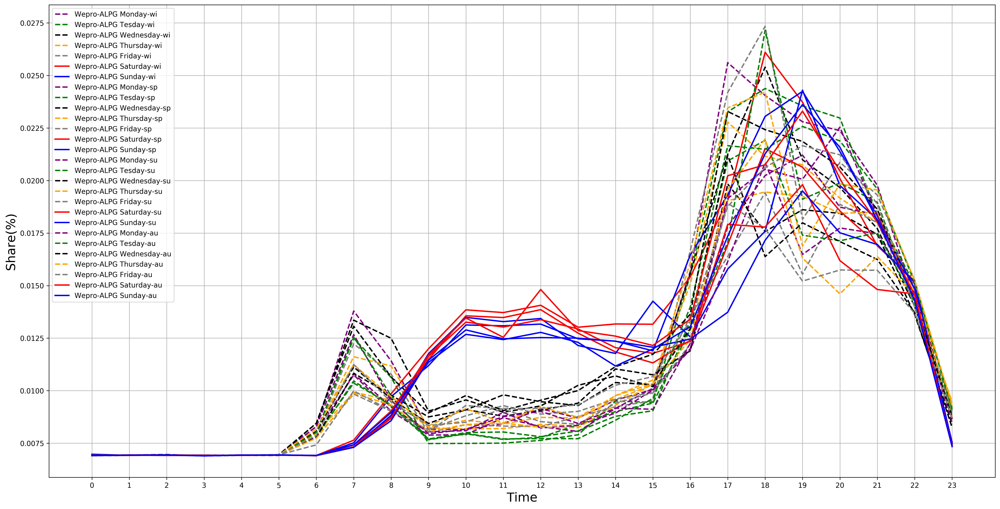

In [8]:
## cacade plot

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
fig = plt.figure(figsize=(20,10), dpi=300)
fig.subplots_adjust(bottom=0.025, left=0.025, top = 0.975, right=0.975)

plt.subplot(1,1,1)
plt.gca().grid(True)
plt.plot(dy1wi[2], color="purple", linewidth=2, linestyle='dashed',label="Wepro-ALPG Monday-wi")
plt.plot(dy1wi[3], color="green", linewidth=2, linestyle='dashed',label="Wepro-ALPG Tesday-wi")
plt.plot(dy1wi[4], color="black",  linewidth=2, linestyle='dashed',label="Wepro-ALPG Wednesday-wi")
plt.plot(dy1wi[5], color="orange",  linewidth=2, linestyle='dashed',label="Wepro-ALPG Thursday-wi")
plt.plot(dy1wi[6], color="grey",   linewidth=2, linestyle='dashed',label="Wepro-ALPG Friday-wi")
plt.plot(dy1wi[0], color="red",    linewidth=2, linestyle='-'     ,label="Wepro-ALPG Saturday-wi")
plt.plot(dy1wi[1], color="blue",    linewidth=2, linestyle='-'    ,label="Wepro-ALPG Sunday-wi")
plt.plot(dy1sp[2], color="purple", linewidth=2, linestyle='dashed',label="Wepro-ALPG Monday-sp")
plt.plot(dy1sp[3], color="green", linewidth=2, linestyle='dashed',label="Wepro-ALPG Tesday-sp")
plt.plot(dy1sp[4], color="black",  linewidth=2, linestyle='dashed',label="Wepro-ALPG Wednesday-sp")
plt.plot(dy1sp[5], color="orange",  linewidth=2, linestyle='dashed',label="Wepro-ALPG Thursday-sp")
plt.plot(dy1sp[6], color="grey",   linewidth=2, linestyle='dashed',label="Wepro-ALPG Friday-sp")
plt.plot(dy1sp[0], color="red",    linewidth=2, linestyle='-'     ,label="Wepro-ALPG Saturday-sp")
plt.plot(dy1sp[1], color="blue",    linewidth=2, linestyle='-'    ,label="Wepro-ALPG Sunday-sp")
plt.plot(dy1su[2], color="purple", linewidth=2, linestyle='dashed',label="Wepro-ALPG Monday-su")
plt.plot(dy1su[3], color="green", linewidth=2, linestyle='dashed',label="Wepro-ALPG Tesday-su")
plt.plot(dy1su[4], color="black",  linewidth=2, linestyle='dashed',label="Wepro-ALPG Wednesday-su")
plt.plot(dy1su[5], color="orange",  linewidth=2, linestyle='dashed',label="Wepro-ALPG Thursday-su")
plt.plot(dy1su[6], color="grey",   linewidth=2, linestyle='dashed',label="Wepro-ALPG Friday-su")
plt.plot(dy1su[0], color="red",    linewidth=2, linestyle='-'     ,label="Wepro-ALPG Saturday-su")
plt.plot(dy1su[1], color="blue",    linewidth=2, linestyle='-'    ,label="Wepro-ALPG Sunday-su")
plt.plot(dy1au[2], color="purple", linewidth=2, linestyle='dashed',label="Wepro-ALPG Monday-au")
plt.plot(dy1au[3], color="green", linewidth=2, linestyle='dashed',label="Wepro-ALPG Tesday-au")
plt.plot(dy1au[4], color="black",  linewidth=2, linestyle='dashed',label="Wepro-ALPG Wednesday-au")
plt.plot(dy1au[5], color="orange",  linewidth=2, linestyle='dashed',label="Wepro-ALPG Thursday-au")
plt.plot(dy1au[6], color="grey",   linewidth=2, linestyle='dashed',label="Wepro-ALPG Friday-au")
plt.plot(dy1au[0], color="red",    linewidth=2, linestyle='-'     ,label="Wepro-ALPG Saturday-au")
plt.plot(dy1au[1], color="blue",    linewidth=2, linestyle='-'    ,label="Wepro-ALPG Sunday-au")

plt.legend(loc='upper left', frameon=True)
plt.ylabel('Share(%)', fontsize=18)    
plt.xlabel('Time', fontsize=18)
plt.xticks(range(24))
plt.tick_params(which='both',labelbottom=True)


plt.savefig('ALPG weekdays-All Seasons.png', dpi=500, facecolor='w', edgecolor='w',
        orientation='portrait', papertype='legal', format=None,
        transparent=False, bbox_inches='tight', pad_inches=0.5)

plt.show()

In [ ]:
#tulis perjam
#datatgl = pd.DataFrame(df2).T
#dataMenit.to_csv('../hasil/hourly-liguria15X.csv', index=False, header=[ ' date','temp'])
#datatgl.to_csv('../data/lpg_per24dy.csv', header = 0, index=False)
#datatgl.head()

## LPG

In [9]:
import pandas as pd

df = pd.read_excel('../data/lpg-hour.xlsx')
print(df.head())
#df.tail()

                 Time     Value
0  '01-01-2015 00:00'  0.003475
1  '01-01-2015 01:00'  0.003075
2  '01-01-2015 02:00'  0.003436
3  '01-01-2015 03:00'  0.003260
4  '01-01-2015 04:00'  0.003382


In [10]:
#kumpulkan semua yang sama jam
per242 = []
df2 = []
for yy in range (0,24):  # iterator jam 0 - 23
    per242.append(int(yy))
    for xx in range (0,8760):
        if xx % 24 == yy:      # yy jam ybs
            jum = df['Value'][xx]
            per242.append(jum)  # simpam setiap jam yang sama      
    zz = per242.copy()
    df2.append(zz)
    per242.clear()

In [11]:
## Preprocessing for Dayweek Comparison, Winter
#hari = ['rabu','kamis','jumat','sabtu','minggu','Senin','Selasa']
#jharA = [2,2,2,2,2,2,2]

dw2A = []
dy2A = []
dw2B = []
dy2B = []

# first half
jum = 0
for dw in range (7):
    
    for kol in range (0,24):
        for bar in range (1,60):
            if bar % 7 == dw:  # 
                jum += df1[kol][bar] 
        dw2A.append(jum/jharA[dw]) # rata-rata
        jum = 0
    
    aa = dw2A.copy()
    dy2A.append(aa)
    dw2A.clear()
len(dy2A)

#Second half

jum = 0
for dw in range (7): 
    for kol in range (0,24):
        for bar in range (335, 366):
            if bar % 7 == dw:  # 
                jum += df2[kol][bar] 
        dw2B.append(jum/jharB[dw]) # rata-rata
        jum = 0
    aa = dw2B.copy()
    dy2B.append(aa)
    dw2B.clear()
len(dy2B)

#total
dy2wi = []
for dw in range (7):
    xxx = [sum(x)/2 for x in zip(dy2A[dw], dy2B[dw])]
    dy2wi.append(xxx)

### next

In [12]:
## Preprocessing for Dayweek Comparison, Spring,Summer,Autum
#hari = ['rabu','kamis','jumat','sabtu','minggu','Senin','Selasa']
jhar = [13,13,13,13,14,13,13] # spring
jum = 0
dw2 = []
dy2sp = []
for dw in range (7):
    for kol in range (0,24):
        for bar in range (60,152):# spring 60,152, Summer 152, 244, Autum 244, 335
            if bar % 7 == dw:  # 
                jum += df2[kol][bar] 
        dw2.append(jum/jhar[dw]) # rata-rata
        jum = 0
    
    aa = dw2.copy()
    dy2sp.append(aa)
    dw2.clear()
len(dy2sp)

7

In [13]:
## Preprocessing for Dayweek Comparison, Spring,Summer,Autum
#hari = ['rabu','kamis','jumat','sabtu','minggu','Senin','Selasa']
jhar = [13,13,13,13,13,14,13] # summer
jum = 0
dw2 = []
dy2su = []
for dw in range (7):
    for kol in range (0,24):
        for bar in range (152, 244):
            if bar % 7 == dw:  # 
                jum += df2[kol][bar] 
        dw2.append(jum/jhar[dw]) # rata-rata
        jum = 0
    
    aa = dw2.copy()
    dy2su.append(aa)
    dw2.clear()
len(dy2su)

7

In [14]:
## Preprocessing for Dayweek Comparison, Spring,Summer,Autum
#hari = ['rabu','kamis','jumat','sabtu','minggu','Senin','Selasa']
jhar = [13,13,13,13,13,13,13] # AUtum
jum = 0
dw2 = []
dy2au = []
for dw in range (7):
    for kol in range (0,24):
        for bar in range (244, 335):
            if bar % 7 == dw:  # 
                jum += df2[kol][bar] 
        dw2.append(jum/jhar[dw]) # rata-rata
        jum = 0
    
    aa = dw2.copy()
    dy2au.append(aa)
    dw2.clear()
len(dy2au)

7

In [ ]:
dy2[0]

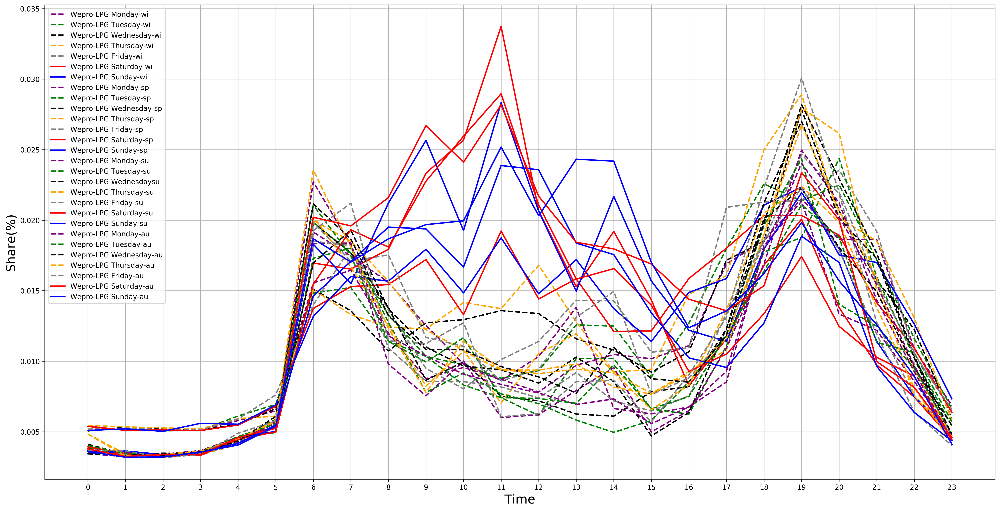

In [15]:
## cacade plot

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
fig = plt.figure(figsize=(20,10), dpi=300)
fig.subplots_adjust(bottom=0.025, left=0.025, top = 0.975, right=0.975)

plt.subplot(1,1,1)
plt.gca().grid(True)
plt.plot(dy2wi[5], color="purple", linewidth=2, linestyle='dashed',label="Wepro-LPG Monday-wi")
plt.plot(dy2wi[6], color="green",  linewidth=2, linestyle='dashed',label="Wepro-LPG Tuesday-wi")
plt.plot(dy2wi[0], color="black",  linewidth=2, linestyle='dashed',label="Wepro-LPG Wednesday-wi")
plt.plot(dy2wi[1], color="orange", linewidth=2, linestyle='dashed',label="Wepro-LPG Thursday-wi")
plt.plot(dy2wi[2], color="grey",   linewidth=2, linestyle='dashed',label="Wepro-LPG Friday-wi")
plt.plot(dy2wi[3], color="red",    linewidth=2, linestyle='-'     ,label="Wepro-LPG Saturday-wi")
plt.plot(dy2wi[4], color="blue",   linewidth=2, linestyle='-'     ,label="Wepro-LPG Sunday-wi")

plt.plot(dy2sp[5], color="purple", linewidth=2, linestyle='dashed',label="Wepro-LPG Monday-sp")
plt.plot(dy2sp[6], color="green",  linewidth=2, linestyle='dashed',label="Wepro-LPG Tuesday-sp")
plt.plot(dy2sp[0], color="black",  linewidth=2, linestyle='dashed',label="Wepro-LPG Wednesday-sp")
plt.plot(dy2sp[1], color="orange", linewidth=2, linestyle='dashed',label="Wepro-LPG Thursday-sp")
plt.plot(dy2sp[2], color="grey",   linewidth=2, linestyle='dashed',label="Wepro-LPG Friday-sp")
plt.plot(dy2sp[3], color="red",    linewidth=2, linestyle='-'     ,label="Wepro-LPG Saturday-sp")
plt.plot(dy2sp[4], color="blue",   linewidth=2, linestyle='-'     ,label="Wepro-LPG Sunday-sp")

plt.plot(dy2su[5], color="purple", linewidth=2, linestyle='dashed',label="Wepro-LPG Monday-su")
plt.plot(dy2su[6], color="green",  linewidth=2, linestyle='dashed',label="Wepro-LPG Tuesday-su")
plt.plot(dy2su[0], color="black",  linewidth=2, linestyle='dashed',label="Wepro-LPG Wednesdaysu")
plt.plot(dy2su[1], color="orange", linewidth=2, linestyle='dashed',label="Wepro-LPG Thursday-su")
plt.plot(dy2su[2], color="grey",   linewidth=2, linestyle='dashed',label="Wepro-LPG Friday-su")
plt.plot(dy2su[3], color="red",    linewidth=2, linestyle='-'     ,label="Wepro-LPG Saturday-su")
plt.plot(dy2su[4], color="blue",   linewidth=2, linestyle='-'     ,label="Wepro-LPG Sunday-su")

plt.plot(dy2au[5], color="purple", linewidth=2, linestyle='dashed',label="Wepro-LPG Monday-au")
plt.plot(dy2au[6], color="green",  linewidth=2, linestyle='dashed',label="Wepro-LPG Tuesday-au")
plt.plot(dy2au[0], color="black",  linewidth=2, linestyle='dashed',label="Wepro-LPG Wednesday-au")
plt.plot(dy2au[1], color="orange", linewidth=2, linestyle='dashed',label="Wepro-LPG Thursday-au")
plt.plot(dy2au[2], color="grey",   linewidth=2, linestyle='dashed',label="Wepro-LPG Friday-au")
plt.plot(dy2au[3], color="red",    linewidth=2, linestyle='-'     ,label="Wepro-LPG Saturday-au")
plt.plot(dy2au[4], color="blue",   linewidth=2, linestyle='-'     ,label="Wepro-LPG Sunday-au")
plt.legend(loc='upper left', frameon=True)
plt.ylabel('Share(%)', fontsize=18)    
plt.xlabel('Time', fontsize=18)
plt.xticks(range(24))
plt.tick_params(which='both',labelbottom=True)


plt.savefig('LPG weekdays-All Seasons.png', dpi=500, facecolor='w', edgecolor='w',
        orientation='portrait', papertype='legal', format=None,
        transparent=False, bbox_inches='tight', pad_inches=0.5)

plt.show()

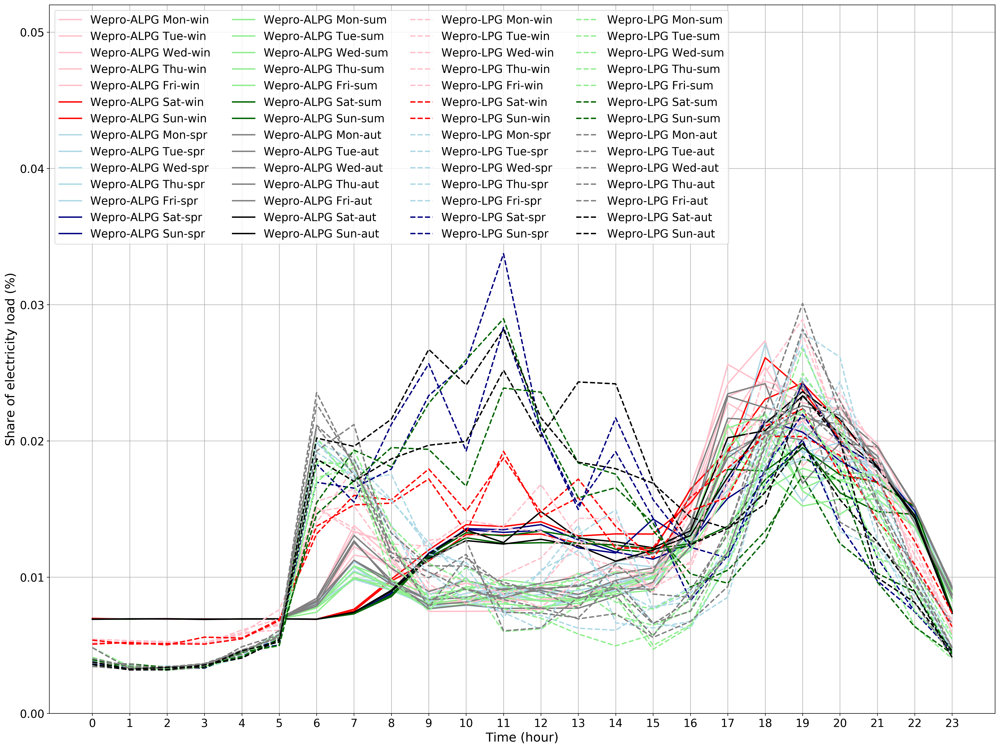

In [40]:
## cacade plot

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
fig = plt.figure(figsize=(20,15), dpi=300)
fig.subplots_adjust(bottom=0.025, left=0.025, top = 0.975, right=0.975)

plt.subplot(1,1,1)
plt.gca().grid(True)

## ALPG
plt.plot(dy1wi[2], color="pink", linewidth=2, linestyle='-',label="Wepro-ALPG Mon-win")
plt.plot(dy1wi[3], color="pink", linewidth=2, linestyle='-',label="Wepro-ALPG Tue-win")
plt.plot(dy1wi[4], color="pink", linewidth=2, linestyle='-',label="Wepro-ALPG Wed-win")
plt.plot(dy1wi[5], color="pink", linewidth=2, linestyle='-',label="Wepro-ALPG Thu-win")
plt.plot(dy1wi[6], color="pink", linewidth=2, linestyle='-',label="Wepro-ALPG Fri-win")
plt.plot(dy1wi[0], color="red",  linewidth=2, linestyle='-',label="Wepro-ALPG Sat-win")
plt.plot(dy1wi[1], color="red",  linewidth=2, linestyle='-',label="Wepro-ALPG Sun-win")

plt.plot(dy1sp[2], color="lightblue", linewidth=2, linestyle='-',label="Wepro-ALPG Mon-spr")
plt.plot(dy1sp[3], color="lightblue", linewidth=2, linestyle='-',label="Wepro-ALPG Tue-spr")
plt.plot(dy1sp[4], color="lightblue", linewidth=2, linestyle='-',label="Wepro-ALPG Wed-spr")
plt.plot(dy1sp[5], color="lightblue", linewidth=2, linestyle='-',label="Wepro-ALPG Thu-spr")
plt.plot(dy1sp[6], color="lightblue", linewidth=2, linestyle='-',label="Wepro-ALPG Fri-spr")
plt.plot(dy1sp[0], color="navy",      linewidth=2, linestyle='-',label="Wepro-ALPG Sat-spr")
plt.plot(dy1sp[1], color="navy",      linewidth=2, linestyle='-',label="Wepro-ALPG Sun-spr")

plt.plot(dy1su[2], color="lightgreen", linewidth=2, linestyle='-',label="Wepro-ALPG Mon-sum")
plt.plot(dy1su[3], color="lightgreen", linewidth=2, linestyle='-',label="Wepro-ALPG Tue-sum")
plt.plot(dy1su[4], color="lightgreen", linewidth=2, linestyle='-',label="Wepro-ALPG Wed-sum")
plt.plot(dy1su[5], color="lightgreen", linewidth=2, linestyle='-',label="Wepro-ALPG Thu-sum")
plt.plot(dy1su[6], color="lightgreen", linewidth=2, linestyle='-',label="Wepro-ALPG Fri-sum")
plt.plot(dy1su[0], color="darkgreen",  linewidth=2, linestyle='-',label="Wepro-ALPG Sat-sum")
plt.plot(dy1su[1], color="darkgreen",  linewidth=2, linestyle='-',label="Wepro-ALPG Sun-sum")

plt.plot(dy1au[2], color="grey", linewidth=2, linestyle='-',label="Wepro-ALPG Mon-aut")
plt.plot(dy1au[3], color="grey", linewidth=2, linestyle='-',label="Wepro-ALPG Tue-aut")
plt.plot(dy1au[4], color="grey", linewidth=2, linestyle='-',label="Wepro-ALPG Wed-aut")
plt.plot(dy1au[5], color="grey", linewidth=2, linestyle='-',label="Wepro-ALPG Thu-aut")
plt.plot(dy1au[6], color="grey", linewidth=2, linestyle='-',label="Wepro-ALPG Fri-aut")
plt.plot(dy1au[0], color="black",linewidth=2, linestyle='-',label="Wepro-ALPG Sat-aut")
plt.plot(dy1au[1], color="black",linewidth=2, linestyle='-',label="Wepro-ALPG Sun-aut")

## LPG
plt.plot(dy2wi[5], color="pink", linewidth=2, linestyle='dashed',label="Wepro-LPG Mon-win")
plt.plot(dy2wi[6], color="pink", linewidth=2, linestyle='dashed',label="Wepro-LPG Tue-win")
plt.plot(dy2wi[0], color="pink", linewidth=2, linestyle='dashed',label="Wepro-LPG Wed-win")
plt.plot(dy2wi[1], color="pink", linewidth=2, linestyle='dashed',label="Wepro-LPG Thu-win")
plt.plot(dy2wi[2], color="pink", linewidth=2, linestyle='dashed',label="Wepro-LPG Fri-win")
plt.plot(dy2wi[3], color="red",  linewidth=2, linestyle='dashed',label="Wepro-LPG Sat-win")
plt.plot(dy2wi[4], color="red",  linewidth=2, linestyle='dashed',label="Wepro-LPG Sun-win")


plt.plot(dy2sp[5], color="lightblue", linewidth=2, linestyle='dashed',label="Wepro-LPG Mon-spr")
plt.plot(dy2sp[6], color="lightblue", linewidth=2, linestyle='dashed',label="Wepro-LPG Tue-spr")
plt.plot(dy2sp[0], color="lightblue", linewidth=2, linestyle='dashed',label="Wepro-LPG Wed-spr")
plt.plot(dy2sp[1], color="lightblue", linewidth=2, linestyle='dashed',label="Wepro-LPG Thu-spr")
plt.plot(dy2sp[2], color="lightblue", linewidth=2, linestyle='dashed',label="Wepro-LPG Fri-spr")
plt.plot(dy2sp[3], color="navy",      linewidth=2, linestyle='dashed',label="Wepro-LPG Sat-spr")
plt.plot(dy2sp[4], color="navy",      linewidth=2, linestyle='dashed',label="Wepro-LPG Sun-spr")

plt.plot(dy2su[5], color="lightgreen", linewidth=2, linestyle='dashed',label="Wepro-LPG Mon-sum")
plt.plot(dy2su[6], color="lightgreen", linewidth=2, linestyle='dashed',label="Wepro-LPG Tue-sum")
plt.plot(dy2su[0], color="lightgreen", linewidth=2, linestyle='dashed',label="Wepro-LPG Wed-sum")
plt.plot(dy2su[1], color="lightgreen", linewidth=2, linestyle='dashed',label="Wepro-LPG Thu-sum")
plt.plot(dy2su[2], color="lightgreen", linewidth=2, linestyle='dashed',label="Wepro-LPG Fri-sum")
plt.plot(dy2su[3], color="darkgreen",  linewidth=2, linestyle='dashed',label="Wepro-LPG Sat-sum")
plt.plot(dy2su[4], color="darkgreen",  linewidth=2, linestyle='dashed',label="Wepro-LPG Sun-sum")

plt.plot(dy2au[5], color="grey", linewidth=2, linestyle='dashed',label="Wepro-LPG Mon-aut")
plt.plot(dy2au[6], color="grey", linewidth=2, linestyle='dashed',label="Wepro-LPG Tue-aut")
plt.plot(dy2au[0], color="grey", linewidth=2, linestyle='dashed',label="Wepro-LPG Wed-aut")
plt.plot(dy2au[1], color="grey", linewidth=2, linestyle='dashed',label="Wepro-LPG Thu-aut")
plt.plot(dy2au[2], color="grey", linewidth=2, linestyle='dashed',label="Wepro-LPG Fri-aut")
plt.plot(dy2au[3], color="black",linewidth=2, linestyle='dashed',label="Wepro-LPG Sat-aut")
plt.plot(dy2au[4], color="black",linewidth=2, linestyle='dashed',label="Wepro-LPG Sun-aut")
plt.legend(loc='upper left', fontsize=16, ncol=4, frameon=True)
plt.ylim(0, 0.052)
plt.ylabel('Share of electricity load (%)', fontsize=18)    
plt.xlabel('Time (hour)', fontsize=18)
plt.xticks(range(24))
plt.tick_params(which='both',labelbottom=True, labelsize=16)


plt.savefig('ALPG-LPG weekdays-All Seasons.png', dpi=500, facecolor='w', edgecolor='w',
        orientation='portrait', papertype='legal', format=None,
        transparent=False, bbox_inches='tight', pad_inches=0.5)

plt.show()

In [ ]:
best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center

In [ ]:
## cek isi list apakas sesuai urutan
# 0 = baris 8 excel = Rabu, 52 hari
# 1 = baris 2 excel = Kamis, 53 hari
# 2 = baris 3 excel = Jumat, 52 hari
# 3 = baris 4 excel = Sabtu, 52 hari
# 4 = baris 5 excel = Minggu, 52 hari
# 5 = baris 6 excel = Senin, 52 hari
# 6 = baris 7 excel = Selasa, 52 hari

dw24no = []
dw24no2 = []
for kol in range (0,24):
    for bar in range (1,366):
        if bar % 7 == 1:  #  0 = baris 8 excel = Rabu
            jum = datatgl[kol][bar] 
            dw24no.append(jum) 
    
    aa = dw24no.copy()
    dw24no2.append(aa)
    dw24no.clear()

len(dw24no2[23])